# image Stitching (Introduction)

https://kornia.readthedocs.io/en/latest/applications/image_stitching.html
#### image stitching process = (image matching between first 2 images + stitching) + (Image matching stitched image with following image) + ...

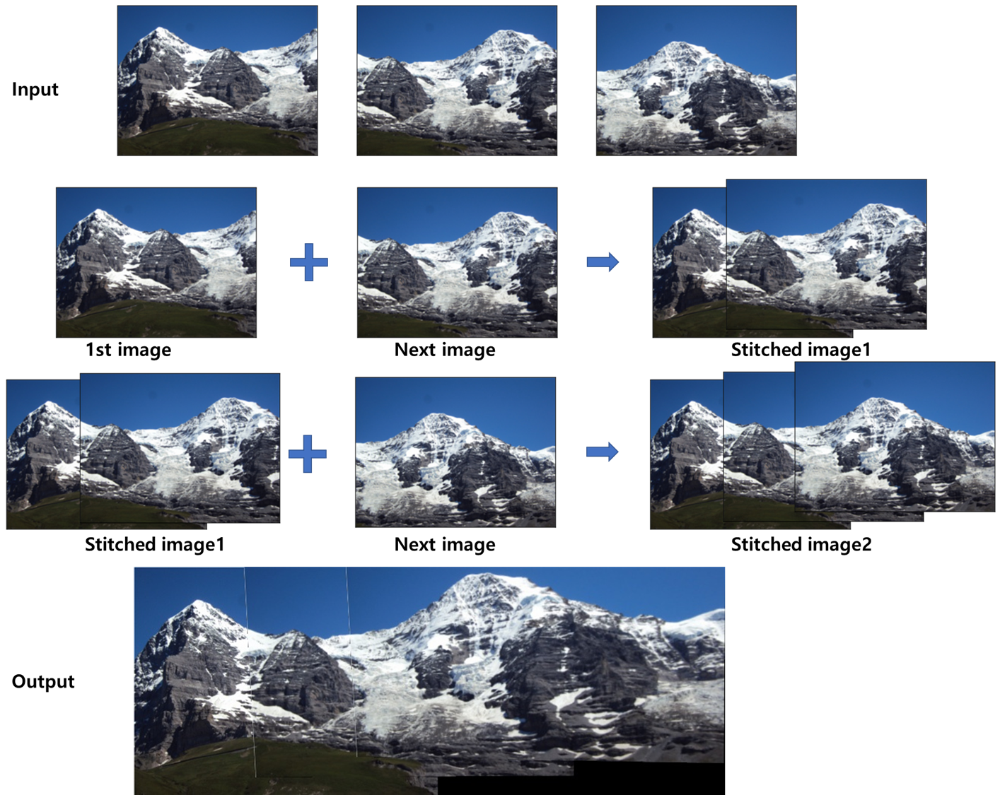

### image matching algorithm (참고용)
LoFTR (Jiaming Sun, Zehong Shen, Yuang Wang, Hujun Bao, and Xiaowei Zhou. LoFTR: detector-free local feature matching with transformers. In CVPR. 2021.)
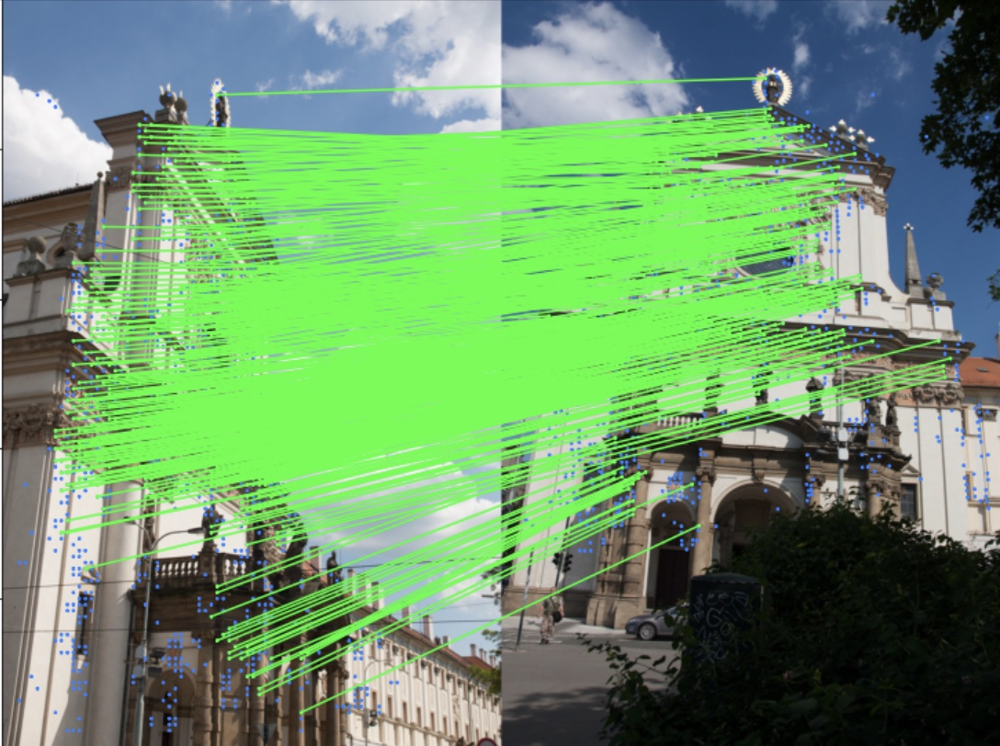

# Application to C-ARM images

### 주요 파라미터
### crop_ratio : C-ARM image 주변 ring 제거 비율, 제거를 할수록 붙이기 성능을 좋아지나, ROI가 작아짐
### blending_method : 새로운 이미지를 이어붙일때 덮어 씌울지, 평균합을 할지 여부, 덮어씌우기 방식이 정합 성능은 더 높을 것으로 생각됨

# coding start

In [1]:
# !pip uninstall opencv-contrib-python -y
# !sudo pip uninstall opencv-python -y

# !pip install opencv-contrib-python
# !pip install opencv-python

# # !pip install -U opencv-contrib-python # ==3.4.2.16
# # !pip install opencv-python==3.4.2.16 
# # !pip install -U opencv-contrib-python==3.4.2.16 --user
# # !pip install opencv-contrib-python==3.4.2.16 --user

# !sudo pip install opencv-python==3.4.2.17
# !sudo pip install opencv-contrib-python==3.4.2.17

# GPU 및 라이브러리 불러오기
import warnings
warnings.filterwarnings("ignore")

# !nvidia-smi
import os
import torch
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
os.environ['CUDA_VISIBLE_DEVICES'] = '6'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

import cv2
print(cv2.__version__)
import sys
import time

import pydicom
import numpy as np
import natsort, glob
import pylab as plt
import mclahe
import random
import monai

def set_seed(seed=42):
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    # torch.backends.cudnn.deterministic = True
    # torch.use_deterministic_algorithms(True)
    monai.utils.misc.set_determinism(seed=seed)
# pl.seed_everything(seed,True)

set_seed()
!nvidia-smi

4.6.0
Thu Aug 11 04:15:19 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  TITAN RTX           Off  | 00000000:1B:00.0 Off |                  N/A |
|100%   87C    P2    95W / 280W |  15239MiB / 24220MiB |    100%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  TITAN RTX           Off  | 00000000:1C:00.0 Off |                  N/A |
| 

In [2]:
# import kornia
# import kornia as K


# img1 = torch.rand(1, 1, 320, 200)
# img2 = torch.rand(1, 1, 128, 128)
# input = {"image0": img1, "image1": img2}
# gftt_hardnet_matcher = K.feature.LocalFeatureMatcher(
#     K.feature.GFTTAffNetHardNet(100), K.feature.DescriptorMatcher('snn', 0.8)
# )
# out = gftt_hardnet_matcher(input)

In [3]:
# SURF 구현, 현재는 안씀..
# # !pip install -U opencv-contrib-python==3.4.2.16
# import cv2
# print(cv2.__version__)
# import sys
# import time

# import pydicom
# import numpy as np
# import natsort, glob
# import pylab as plt

# class matchers:
#     def __init__(self):
#         self.surf = cv2.xfeatures2d.SURF_create()
#         FLANN_INDEX_KDTREE = 0
#         index_params = dict(algorithm=0, trees=5)
#         search_params = dict(checks=50)
#         self.flann = cv2.FlannBasedMatcher(index_params, search_params)

#     def match(self, i1, i2, direction=None):
#         imageSet1 = self.getSURFFeatures(i1)
#         imageSet2 = self.getSURFFeatures(i2)
# #         print("Direction : ", direction)
#         matches = self.flann.knnMatch(imageSet2['des'], imageSet1['des'], k=2)
#         good = []
#         for i , (m, n) in enumerate(matches):
#             if m.distance < 0.8*n.distance: # 0.7
#                 good.append((m.trainIdx, m.queryIdx))
# #         print(len(good)) # good features
#         if len(good) > 4:
#             pointsCurrent = imageSet2['kp']
#             pointsPrevious = imageSet1['kp']

#             matchedPointsCurrent = np.float32([pointsCurrent[i].pt for (__, i) in good])
#             matchedPointsPrev = np.float32([pointsPrevious[i].pt for (i, __) in good])
#             H, s = cv2.findHomography(matchedPointsCurrent, matchedPointsPrev, cv2.RANSAC, 4)
#             return H
#         return None

#     def getSURFFeatures(self, im):
#         if len(im.shape)==3:
#             gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
#         else: 
#             gray = im
#         kp, des = self.surf.detectAndCompute(gray, None)
#         return {'kp':kp, 'des':des}

# class Stitch:
#     def __init__(self, imgList=None, imgArray=None, show_inputImage=True, resize_shape=None, image_overlay=True, print_msg=False):
#         self.print_msg = print_msg
#         self.image_overlay = image_overlay
        
#         if imgList:
#             self.images = [cv2.imread(each) for each in imgList]            
#         elif imgArray:
#             self.images = imgArray # resize needed
            
#         if resize_shape:    
#             self.images = [cv2.resize(img, resize_shape) for img in self.images] # you wanna resize?
            
#         if show_inputImage:
#             plot_input(self.images)
#         self.count = len(self.images)
#         self.left_list, self.right_list, self.center_im = [], [], None
#         self.matcher_obj = matchers()
#         self.prepare_lists()
#         self.trim_size = 0
        
#     def prepare_lists(self):
#         print("Number of images : %d"%self.count) 
#         self.centerIdx = self.count/2 
#         print("Center index image : %d"%self.centerIdx) if self.print_msg else 0
#         self.center_im = self.images[int(self.centerIdx)]
# #         for i in range(self.count):
# #             if(i<=self.centerIdx):
# #                 self.left_list.append(self.images[i])
# #             else:
# #                 self.right_list.append(self.images[i])                
#         for i in range(self.count):
#             self.left_list.append(self.images[i])
#         print("Image lists prepared") if self.print_msg else 0

#     def leftshift(self):
#         # self.left_list = reversed(self.left_list)
#         a = self.left_list[0]
        
#         for b in self.left_list[1:]:
#             H = self.matcher_obj.match(a, b, 'left')
# #             print("Homography is : ", H) 
#             xh = np.linalg.inv(H)
# #             print("Inverse Homography :", xh)
#             ds = np.dot(xh, np.array([a.shape[1], a.shape[0], 1]));
#             ds = ds/ds[-1]
#             print("final ds=>", ds) if self.print_msg else 0
#             self.trim_size = [int(ds[1]),int(ds[0])]

#             f1 = np.dot(xh, np.array([0,0,1]))
#             f1 = f1/f1[-1]
#             xh[0][-1] += abs(f1[0])
#             xh[1][-1] += abs(f1[1])
#             ds = np.dot(xh, np.array([a.shape[1], a.shape[0], 1]))
#             offsety = abs(f1[1])
#             offsetx = abs(f1[0])
#             dsize = (abs(int(ds[0]+offsetx)), abs(int(ds[1]+ offsety)))
#             print("image dsize =>", dsize, offsetx, offsety) if self.print_msg else 0
#             tmp = cv2.warpPerspective(a, xh, dsize)
# #             try:
# #                 h1 = int(offsety)
# #                 h2 = int(b.shape[0]+offsety)
# #                 w1 = int(offsetx)
# #                 w2 = int(b.shape[1]+offsetx) 
# #                 if self.image_overlay:
# #                     tmp[h1:h2, w1:w2] = b//2+(tmp[h1:h2, w1:w2])//2
# #                 else:
# #                     tmp[h1:h2, w1:w2] = b
# #             except:  # in case dimension is reduced
# #                 h1 = int(offsety) 
# #                 h2 = int(b.shape[0]+offsety)
# #                 w1 = int(offsetx)
# #                 w2 = int(b.shape[1]+offsetx)               
# # #                 print(f'b{b.shape} tmp{tmp.shape}')
# #                 dh,dw,_ = tmp[h1:h2, w1:w2].shape
# #                 if self.image_overlay:
# #                     tmp[h1:h1+dh, w1:w1+dw] = b[:dh,:dw]//2+(tmp[h1:h1+dh, w1:w1+dw])//2
# #                 else:
# #                     tmp[h1:h1+dh, w1:w1+dw] = b[:dh,:dw]
            
#             h1 = int(offsety) 
#             h2 = int(b.shape[0]+offsety)
#             w1 = int(offsetx)
#             w2 = int(b.shape[1]+offsetx)               
# #                 print(f'b{b.shape} tmp{tmp.shape}')
#             dh,dw,_ = tmp[h1:h2, w1:w2].shape
#             if self.image_overlay:
#                 tmp[h1:h1+dh, w1:w1+dw] = b[:dh,:dw]//2+(tmp[h1:h1+dh, w1:w1+dw])//2
#             else:
#                 tmp[h1:h1+dh, w1:w1+dw] = b[:dh,:dw]
                
#             a = tmp        
#             print(f'b{b.shape} tmp{tmp.shape}') if self.print_msg else 0
            
#         self.leftImage = tmp.astype(np.uint8)
#         self.trim_left()
# #         return self.leftImage

#     def rightshift(self):
#         for each in self.right_list:
#             H = self.matcher_obj.match(self.leftImage, each, 'right')
# #             print( "Homography :", H)
#             txyz = np.dot(H, np.array([each.shape[1], each.shape[0], 1]))
#             txyz = txyz/txyz[-1]
#             dsize = (int(txyz[0])+self.leftImage.shape[1], int(txyz[1])+self.leftImage.shape[0])
#             tmp = cv2.warpPerspective(each, H, dsize)
#             # tmp[:self.leftImage.shape[0], :self.leftImage.shape[1]]=self.leftImage
# #             tmp = self.mix_and_match(self.leftImage, tmp)
# #             print("tmp shape",tmp.shape)
# #             print("self.leftimage shape=", self.leftImage.shape)
#             self.leftImage = tmp

#     def mix_and_match(self, leftImage, warpedImage):
#         i1y, i1x = leftImage.shape[:2]
#         i2y, i2x = warpedImage.shape[:2]
#         print(leftImage[-1,-1]) if self.print_msg else 0

#         t = time.time()
#         black_l = np.where(leftImage == np.array([0,0,0]))
#         black_wi = np.where(warpedImage == np.array([0,0,0]))
#         print(time.time() - t) if self.print_msg else 0
#         print(black_l[-1]) if self.print_msg else 0

#         for i in range(0, i1x):
#             for j in range(0, i1y):
#                 try:
#                     if(np.array_equal(leftImage[j,i],np.array([0,0,0])) and  np.array_equal(warpedImage[j,i], np.array([0,0,0]))):
#                         # print( "BLACK")
#                         # instead of just putting it with black, 
#                         # take average of all nearby values and avg it.
#                         warpedImage[j,i] = [0, 0, 0]
#                     else:
#                         if(np.array_equal(warpedImage[j,i],[0,0,0])):
#                             warpedImage[j,i] = leftImage[j,i]
#                         else:
#                             if not np.array_equal(leftImage[j,i], [0,0,0]):
#                                 bw, gw, rw = warpedImage[j,i]
#                                 bl,gl,rl = leftImage[j,i]
#                                 b = (bl+bw)/2
#                                 g = (gl+gw)/2
#                                 r = (rl+rw)/2
#                                 warpedImage[j, i] = [bl,gl,rl]
#                 except:
#                     pass
#         return warpedImage

#     def trim_left(self):
#         self.leftImage = self.leftImage[:self.trim_size[0],:self.trim_size[1]]
# def plot_input(imgs):
#     plt.figure(figsize=(16,16))
#     for idx in range(len(imgs)):
#         plt.subplot(1,len(imgs),idx+1)
#         plt.title(f'input_{str(idx)}')
#         plt.imshow(imgs[idx],cmap='gray')
#         plt.axis('off')
#     plt.tight_layout()
#     plt.show()
    
# def minmax(array):
#     tmp = (array-np.min(array))/(np.max(array)-np.min(array))
#     tmp = tmp*255
#     return tmp.astype(np.uint8)

# import albumentations as A
# transform = A.Compose([
#     A.ShiftScaleRotate(shift_limit=0,scale_limit=0.1, rotate_limit=10, p=0.5),
#     A.Perspective(scale=(0.005,0.01),p=0.5),
# ])

# def dcm2torch(path):
#     img = pydicom.dcmread(path)
#     img = img.pixel_array
#     h,w = img.shape
#     img = img[int(h*.2):int(h*.8),int(w*.2):int(w*.8)]
#     img = cv2.resize(img,(512,512))
#     # img = minmax(img)
#     img = mclahe.mclahe(img)
#     img = torch.tensor(img)
#     img = img.unsqueeze(0).unsqueeze(0)
#     img = img.float()
#     return img

# def extractPatchHorizontal_DCM(path, patch_size, delta, height, rand, augmentation=False, show=False):
#     img = pydicom.dcmread(path)
#     img = img.pixel_array
#     img = minmax(img)
#     h_max, w_max = img.shape
    
#     if show:
#         print(f'original DCM size {img.shape}')
#         plt.figure(figsize=(16,16))
#         plt.title('Original image')
#         plt.imshow(img,cmap='gray')
#         plt.show()

#     img_array = []
#     for i in range(0, w_max//delta-1): # 가장 마지막 부분은 버림
#         tmp = np.zeros((patch_size,patch_size,3))
#         w1 = i*delta
#         w2 = i*delta + patch_size
# #         print(i,w1,w2)

#         dh = np.random.randint(0,rand,1)[0]
#         dw = np.random.randint(0,rand,1)[0]
# #         print(f'i {i} h1:{height+dh} h2:{patch_size+height+dh}, w1:{w1+dw} w2:{w2+dw}')
#         extracted = img[height+dh:patch_size+height+dh,w1+dw:w2+dw]
#         tmp[:extracted.shape[0],:extracted.shape[1],0] = extracted
#         tmp[:extracted.shape[0],:extracted.shape[1],1] = extracted
#         tmp[:extracted.shape[0],:extracted.shape[1],2] = extracted
        
#         if augmentation:
#             transformed = transform(image=tmp)
#             tmp = transformed["image"]
#         tmp = minmax(tmp)
#         img_array.append(tmp)
        
#     return img_array

# def extractPatchAll_DCM(path, patch_size, show=False):
#     img = pydicom.dcmread(path)
#     img = img.pixel_array
#     img = minmax(img)
#     h_max, w_max = img.shape
    
#     if show:
#         print(f'original DCM size {img.shape}')
#         plt.figure(figsize=(16,16))
#         plt.title('Original image')
#         plt.imshow(img,cmap='gray')
#         plt.show()

#     img_crop = np.zeros_like(img)
#     img_cropAvg = np.zeros_like(img)
#     rand = np.random.randint(5,20,1)[0]
#     for i in range(0, rand): # 가장 마지막 부분은 버림
        
#         h1 = np.random.randint(0,h_max-patch_size,1)[0]
#         w1 = np.random.randint(0,w_max-patch_size,1)[0]
#         h2 = h1+patch_size
#         w2 = w1+patch_size

#         img_crop[h1:h2,w1:w2] = img[h1:h2,w1:w2]
#         img_cropAvg[h1:h2,w1:w2] += minmax(img[h1:h2,w1:w2])
    
#     if show:
#         print(f'original DCM size {img.shape}')
#         plt.figure(figsize=(16,16))
#         plt.subplot(121)
#         plt.imshow(img_crop,cmap='gray')
#         plt.subplot(122)
#         plt.imshow(img_cropAvg,cmap='gray')
#         plt.show()
        
#     return img_crop, img_cropAvg

# Stitching algorithm

In [4]:
from typing import Dict, List, Optional, Tuple

import torch
import torch.nn as nn

from kornia.color import rgb_to_grayscale
from kornia.feature import LocalFeatureMatcher, LoFTR
from kornia.geometry.homography import find_homography_dlt_iterated
from kornia.geometry.ransac import RANSAC
from kornia.geometry.transform import warp_perspective

class ImageStitcher(nn.Module):
    """Stitch two images with overlapping fields of view.

    Args:
        matcher: image feature matching module.
        estimator: method to compute homography, either "vanilla" or "ransac".
            "ransac" is slower with a better accuracy.
        blending_method: method to blend two images together.
            Only "naive" is currently supported.

    Note:
        Current implementation requires strict image ordering from left to right.

    .. code-block:: python

        IS = ImageStitcher(KF.LoFTR(pretrained='outdoor'), estimator='ransac').to(device)
        # Compute the stitched result with less GPU memory cost.
        with torch.inference_mode():
            out = IS(img_left, img_right)
        # Show the result
        plt.imshow(K.tensor_to_image(out))
    """

    def __init__(self, matcher: nn.Module, estimator: str = 'ransac', blending_method: str = "naive", show=False) -> None:
        super().__init__()
        self.matcher = matcher
        self.estimator = estimator
        self.blending_method = blending_method
        self.show = show
        if estimator not in ['ransac', 'vanilla']:
            raise NotImplementedError(f"Unsupported estimator {estimator}. Use ‘ransac’ or ‘vanilla’ instead.")
        if estimator == "ransac":
            self.ransac = RANSAC('homography')

    def _estimate_homography(self, keypoints1: torch.Tensor, keypoints2: torch.Tensor) -> torch.Tensor:
        """Estimate homography by the matched keypoints.

        Args:
            keypoints1: matched keypoint set from an image, shaped as :math:`(N, 2)`.
            keypoints2: matched keypoint set from the other image, shaped as :math:`(N, 2)`.
        """
        homo: torch.Tensor
        if self.estimator == "vanilla":
            homo = find_homography_dlt_iterated(
                keypoints2[None], keypoints1[None], torch.ones_like(keypoints1[None, :, 0])
            )
        elif self.estimator == "ransac":
            homo, _ = self.ransac(keypoints2, keypoints1)
            homo = homo[None]
        else:
            raise NotImplementedError(f"Unsupported estimator {self.estimator}. Use ‘ransac’ or ‘vanilla’ instead.")
        return homo

    def estimate_transform(self, **kwargs) -> torch.Tensor:
        """Compute the corresponding homography."""
        homos: List[torch.Tensor] = []
        kp1, kp2, idx = kwargs['keypoints0'], kwargs['keypoints1'], kwargs['batch_indexes']
        for i in range(len(idx.unique())):
            homos.append(self._estimate_homography(kp1[idx == i], kp2[idx == i]))
        if len(homos) == 0:
            raise RuntimeError("Compute homography failed. No matched keypoints found.")
        return torch.cat(homos)

    def blend_image(self, src_img: torch.Tensor, dst_img: torch.Tensor, mask: torch.Tensor) -> torch.Tensor:
        """Blend two images together."""
        out: torch.Tensor
        if self.blending_method == "naive":
            # out = torch.where(mask == 1, src_img, dst_img)  # original implement
            
            src_img_mask = src_img.clone()
            src_img_mask[src_img_mask!=0]=1
            dst_img_mask = dst_img.clone()
            dst_img_mask[dst_img_mask!=0]=1
            overlap_mask = src_img_mask*dst_img_mask
            overlap_mask[overlap_mask!=0] = 1
            only_src_img_mask = src_img_mask- overlap_mask
            only_src_img_mask[only_src_img_mask!=1]=0
            only_dst_img_mask = dst_img_mask- overlap_mask
            only_dst_img_mask[only_dst_img_mask!=1]=0
            
            # plt.subplot(141)
            # plt.imshow(overlap_mask[0,0].cpu().detach())
            # plt.subplot(142)
            # plt.imshow(only_src_img_mask[0,0].cpu().detach())
            # plt.subplot(143)
            # plt.imshow(only_dst_img_mask[0,0].cpu().detach())
            # plt.subplot(144)
            # plt.imshow(overlap_mask[0,0].cpu().detach()+ only_src_img_mask[0,0].cpu().detach()+ only_dst_img_mask[0,0].cpu().detach())
            # plt.show()
            
            out = torch.where(overlap_mask == 1, src_img, dst_img)
            out = torch.where(only_dst_img_mask == 1, dst_img, out)
            out = torch.where(only_src_img_mask == 1, src_img, out)
            
        elif self.blending_method == "average":
            
            # out = torch.where(mask == 1, src_img, dst_img) # original implement
            
            src_img_mask = src_img.clone()
            src_img_mask[src_img_mask!=0]=1
            dst_img_mask = dst_img.clone()
            dst_img_mask[dst_img_mask!=0]=1
            overlap_mask = src_img_mask*dst_img_mask
            overlap_mask[overlap_mask!=0] = 1
            only_src_img_mask = src_img_mask- overlap_mask
            only_src_img_mask[only_src_img_mask!=1]=0
            only_dst_img_mask = dst_img_mask- overlap_mask
            only_dst_img_mask[only_dst_img_mask!=1]=0
            
            # plt.subplot(141)
            # plt.imshow(overlap_mask[0,0].cpu().detach())
            # plt.subplot(142)
            # plt.imshow(only_src_img_mask[0,0].cpu().detach())
            # plt.subplot(143)
            # plt.imshow(only_dst_img_mask[0,0].cpu().detach())
            # plt.subplot(144)
            # plt.imshow(overlap_mask[0,0].cpu().detach()+ only_src_img_mask[0,0].cpu().detach()+ only_dst_img_mask[0,0].cpu().detach())
            # plt.show()
            
            # out = torch.where(overlap_mask == 1, (src_img+dst_img)/2, src_img)
            out = torch.where(overlap_mask == 1, (src_img+dst_img)/2, dst_img)
            out = torch.where(only_dst_img_mask == 1, dst_img, out)
            out = torch.where(only_src_img_mask == 1, src_img, out)
            
        else:
            raise NotImplementedError(f"Unsupported blending method {self.blending_method}. Use ‘naive’.")
        return out

    def preprocess(self, image_1: torch.Tensor, image_2: torch.Tensor) -> Dict[str, torch.Tensor]:
        """Preprocess input to the required format."""
        # TODO: probably perform histogram matching here.
        if isinstance(self.matcher, LoFTR) or isinstance(self.matcher, LocalFeatureMatcher):
            input_dict: Dict[str, torch.Tensor] = {  # LofTR works on grayscale images only
                # "image0": rgb_to_grayscale(image_1), # orignal impliment
                # "image1": rgb_to_grayscale(image_2), # orignal impliment
                "image0": image_1,
                "image1": image_2,
            }
        else:
            raise NotImplementedError(f"The preprocessor for {self.matcher} has not been implemented.")
        return input_dict

    def postprocess(self, image: torch.Tensor, mask: torch.Tensor) -> torch.Tensor:
        # NOTE: assumes no batch mode. This method keeps all valid regions after stitching.
        mask_: torch.Tensor = mask.sum((0, 1))
        index: int = int(mask_.bool().any(0).long().argmin().item())
        if index == 0:  # If no redundant space
            return image
        return image[..., :index]
    
    def postprocess_(self, image: torch.Tensor, mask: torch.Tensor) -> torch.Tensor:
        # NOTE: assumes no batch mode. This method keeps all valid regions after stitching.
        mask_: torch.Tensor = mask.sum((0, 1))
        index: int = int(mask_.bool().any(0).long().argmin().item())
        if index == 0:  # If no redundant space
            return image
        
        i = 2**6
        n = index//(i)
        remain = index%(i)
        index = (i)*(n) if remain==0 else (i)*(n+1)
        return image[..., :index], mask[..., :index]

    def on_matcher(self, data) -> dict:
        correspondences = self.matcher(data)
        correspondences = refine_features(data, correspondences, self.show)
        
        return correspondences

    def stitch_pair(
        self,
        images_left: torch.Tensor,
        images_right: torch.Tensor,
        mask_left: Optional[torch.Tensor] = None,
        mask_right: Optional[torch.Tensor] = None,
    ) -> Tuple[torch.Tensor, torch.Tensor]:
        # Compute the transformed images
        input_dict: Dict[str, torch.Tensor] = self.preprocess(images_left, images_right)
        out_shape: Tuple[int, int] = (images_left.shape[-2], images_left.shape[-1] + images_right.shape[-1])
        correspondences: dict = self.on_matcher(input_dict)
        homo: torch.Tensor = self.estimate_transform(**correspondences)
        src_img = warp_perspective(images_right, homo, out_shape)
        dst_img = torch.cat([images_left, torch.zeros_like(images_right)], dim=-1) # original
        
        # Compute the transformed masks
        if mask_left is None:
            mask_left = torch.ones_like(images_left)
        if mask_right is None:
            mask_right = torch.ones_like(images_right)
        # 'nearest' to ensure no floating points in the mask
        src_mask = warp_perspective(mask_right, homo, out_shape, mode='nearest')
        dst_mask = torch.cat([mask_left, torch.zeros_like(mask_right)], dim=-1)
        return self.blend_image(src_img, dst_img, src_mask), (dst_mask + src_mask).bool().to(src_mask.dtype)

    def forward(self, *imgs: torch.Tensor) -> torch.Tensor:
        img_out = imgs[0]
        mask_left = torch.ones_like(img_out)
        for i in range(len(imgs) - 1):
            img_out, mask_left = self.stitch_pair(img_out, imgs[i + 1], mask_left)
            img_out, mask_left = self.postprocess_(img_out, mask_left)
        return self.postprocess(img_out, mask_left)

In [5]:
import kornia as K
import kornia.feature as KF
from kornia_moons.feature import draw_LAF_matches

def minmax(array):
    return (array-np.min(array))/(np.max(array)-np.min(array))

def dcm2torch(path, crop_ratio=0, resize_shape=(512,512), rotate90=False, fliplr=False):
    if 'dcm' in path:
        img = pydicom.dcmread(path)
        img = img.pixel_array
    else:
        img = cv2.imread(path)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    h,w = img.shape
    img = img[int(h*crop_ratio):int(h*(1-crop_ratio)),int(w*crop_ratio):int(w*(1-crop_ratio))] # crop
    # mask = img.copy()
    
    # img = cv2.resize(img, resize_shape, cv2.INTER_CUBIC) # CLAHE
    img = cv2.resize(img, resize_shape, cv2.INTER_NEAREST_EXACT) # CLAHE
    # mask = cv2.resize(img, resize_shape, cv2.INTER_NEAREST_EXACT) # CLAHE
    
    if rotate90:
        img = np.rot90(img,1) # in case of spine images
    if fliplr:
        img = np.fliplr(img)
        
    # img = minmax(img)
    # img = mclahe.mclahe(img) # CLAHE
    img = mclahe.mclahe(img,clip_limit=0.001) # CLAHE
    # img = mclahe.mclahe(img, n_bins=128, clip_limit=0.02, adaptive_hist_range=True) # CLAHE
    img = torch.tensor(img)
    img = img.unsqueeze(0).unsqueeze(0)
    # img = K.enhance.sharpness(img,8)
    img = img.float()
    return img

def check_features_2Dicom(path_dcm1, path_dcm2, crop_ratio, show=False):
    image0 = dcm2torch(path_dcm1,crop_ratio)
    image1 = dcm2torch(path_dcm2,crop_ratio)

    images_dict = {"image0": image0.to(device), # LofTR works on grayscale images only 
                   "image1": image1.to(device)}
    
    matcher = LoFTR(pretrained='indoor').to(device)
    correspondences  = matcher(images_dict)
    refine_features(images_dict, correspondences, show)

import scipy
import scipy.ndimage

def refine_features(images_dict, correspondences, show=False):
    
    image0 = images_dict['image0']
    image1 = images_dict['image1']
    mask0 = image0.clone()
    mask1 = image1.clone()
    mask0[mask0!=0] = 1
    mask1[mask1!=0] = 1
                                            
#     kernel = torch.ones(21,21).to(device)
#     plt.subplot(121)
#     plt.imshow(mask0[0,0].cpu().detach(),alpha=0.5)
#     plt.subplot(122)
#     plt.imshow(mask1[0,0].cpu().detach(),alpha=0.5)
#     mask0 = K.morphology.dilation(mask0,kernel)
#     mask0 = K.morphology.opening(mask0,kernel)
#     mask0 = K.morphology.erosion(mask0,kernel)
#     mask0 = K.morphology.erosion(mask0,kernel)
#     mask0 = K.morphology.erosion(mask0,kernel)
#     mask1 = K.morphology.dilation(mask1,kernel)
#     mask1 = K.morphology.opening(mask1,kernel)
#     mask1 = K.morphology.erosion(mask1,kernel)
#     mask1 = K.morphology.erosion(mask1,kernel)
#     mask1 = K.morphology.erosion(mask1,kernel)
#     plt.subplot(121)
#     plt.imshow(mask0[0,0].cpu().detach(),alpha=0.5)
#     plt.subplot(122)
#     plt.imshow(mask1[0,0].cpu().detach(),alpha=0.5)
#     plt.show()
#     ####################################################
        
    b = correspondences['batch_indexes']
    c = correspondences['confidence']
    kp0 = correspondences['keypoints0']
    kp1 = correspondences['keypoints1']
    threshold = np.percentile(c.cpu().numpy(), 10)
    # threshold = np.percentile(c.cpu().numpy(), 30)
    # threshold = np.percentile(c.cpu().numpy(), 50)
    left = image0.size(3)-512+512/4
    right = int(image1.size(3)*3/4)
    # upper = 96
    # lower = int(image1.size(2)) - upper
    
    for i in reversed(range(len(kp0))):
        # if mask0[0,0][kp0[i,1].long(),kp0[i,0].long()]==0 or mask1[0,0][kp1[i,1].long(), kp1[i,0].long()]==0 or kp0[i,0].long()<left or kp1[i,0].long()>right or c[i]<=threshold:
        # if kp0[i,0].long()<left or kp1[i,0].long()>right or c[i]<=threshold:
        # if kp0[i,0].long()<left or kp1[i,0].long()>right or kp0[i,1].long()<upper or kp0[i,1].long()>lower or kp1[i,1].long()<upper or kp1[i,1].long()>lower:
        # if c[i]<=threshold:
        if mask0[0,0][kp0[i,1].long(),kp0[i,0].long()]==0 or mask1[0,0][kp1[i,1].long(),kp1[i,0].long()]==0 or kp0[i,0].long()<=left or kp1[i,0].long()>=right or c[i]<=threshold:
        # if kp0[i,0].long()<=left or kp1[i,0].long()>=right or c[i]<=threshold:
            b = b[torch.arange(b.size(0))!=i]
            c = c[torch.arange(c.size(0))!=i]
            kp0 = kp0[torch.arange(kp0.size(0))!=i]
            kp1 = kp1[torch.arange(kp1.size(0))!=i]
    print('feature counts:',len(kp0), threshold, image0.shape, image1.shape)

#     plt.subplot(121)
#     plt.hist(kp0[:,0].cpu().detach())
#     plt.subplot(122)
#     plt.hist(kp1[:,0].cpu().detach())
#     plt.show()

    correspondences['batch_indexes'] = b
    correspondences['confidence'] = c
    correspondences['keypoints0'] = kp0
    correspondences['keypoints1'] = kp1
    
    if show:
        # plt.subplot(121)
        # # for i in range(len(kp0)):
        # for i in range(10):
        #     plt.imshow(image0[0,0].cpu().numpy())
        #     plt.scatter(kp0[i,0].long().cpu().numpy(),kp0[i,1].long().cpu().numpy())
        # plt.xlim(0,512)
        # plt.ylim(0,512)
        # plt.subplot(122)
        # # for i in range(len(kp1)):
        # for i in range(10):
        #     plt.imshow(image1[0,0].cpu().numpy())
        #     plt.scatter(kp1[i,0].long().cpu().numpy(),kp1[i,1].long().cpu().numpy())
        # plt.xlim(0,512)
        # plt.ylim(0,512)
        # plt.show()
        
        kp0 = kp0.cpu().numpy()
        kp1 = kp1.cpu().numpy()
        H, inliers = cv2.findFundamentalMat(kp0, kp1, cv2.USAC_MAGSAC, 0.5, 0.999, 100000)
        inliers = inliers > 0
        draw_LAF_matches(
        KF.laf_from_center_scale_ori(torch.from_numpy(kp0).view(1,-1, 2),
                                    torch.ones(kp0.shape[0]).view(1,-1, 1, 1),
                                    torch.ones(kp0.shape[0]).view(1,-1, 1)),
        KF.laf_from_center_scale_ori(torch.from_numpy(kp1).view(1,-1, 2),
                                    torch.ones(kp1.shape[0]).view(1,-1, 1, 1),
                                    torch.ones(kp1.shape[0]).view(1,-1, 1)),
        torch.arange(kp0.shape[0]).view(-1,1).repeat(1,2),
        K.tensor_to_image(images_dict[f'image0']),
        K.tensor_to_image(images_dict[f'image1']),
        inliers,
        draw_dict={'inlier_color': (0.2, 1, 0.2),
                   'tentative_color': None,
                   # 'tentative_color': (0.8, 0.8, 0), 
                   'feature_color': None,
                   # 'feature_color': (0.2, 0.5, 1),
                   'vertical': False})
        plt.show()
    return correspondences
        
def stitch_files(files, crop_ratio, rotate90, blending_method='naive', direction='left2right', show=False):
    '''
    files : list of dcm or png files
    rotate90 : False or True
    blending_method : 'naive' or 'average'
    direction : 'left2right' 
    '''    
    img_counts = len(files)
    resize_shape = (512,512)
    # resize_shape = (768,768)
    # assert len(files) dual_direction
    
    if direction=='left2right':
        imgs = []
        plt.figure(figsize=(20,4)) if show else 0
        for i in range(len(files)):     
            img = dcm2torch(files[i], crop_ratio=crop_ratio, resize_shape=resize_shape, rotate90=False, fliplr=False)
            if show:
                plt.subplot(1,len(files),i+1)
                plt.title(files[i].split('/')[-1])
                plt.imshow(img[0,0],cmap='gray') # show inputs
            img = dcm2torch(files[i], crop_ratio=crop_ratio, resize_shape=resize_shape, rotate90=rotate90, fliplr=False)
            imgs.append(img.to(device))
        plt.show() if show else 0

        # do stitching
        matcher = LoFTR(pretrained='indoor',)
        # matcher = LoFTR(pretrained='outdoor',)
        # matcher = K.feature.LocalFeatureMatcher(K.feature.GFTTAffNetHardNet(2000), K.feature.DescriptorMatcher('snn', 0.8))
        IS = ImageStitcher(matcher, estimator='ransac', blending_method=blending_method, show=show).to(device)
        with torch.no_grad():
            out = IS(*imgs)
        out = out.cpu().detach()[0,0]
        
    elif direction=='side2center':
        imgs_left = []
        imgs_right = []
        plt.figure(figsize=(20,4)) if show else 0
        for i in range(len(files)):     
            img = dcm2torch(files[i], crop_ratio=crop_ratio, resize_shape=resize_shape, rotate90=False, fliplr=False)
            if show:
                plt.subplot(1,len(files),i+1)
                plt.title(files[i].split('/')[-1])
                plt.imshow(img[0,0],cmap='gray') # show inputs
            if i < len(files)//2:
                img = dcm2torch(files[i], crop_ratio=crop_ratio, resize_shape=resize_shape, rotate90=rotate90, fliplr=False)
                imgs_left.append(img.to(device))
            else:
                img = dcm2torch(files[i], crop_ratio=crop_ratio, resize_shape=resize_shape, rotate90=rotate90, fliplr=True)
                imgs_right.append(img.to(device))
        imgs_right = list(reversed(imgs_right))
        plt.show() if show else 0

        # do stitching
        matcher = LoFTR(pretrained='indoor',)
        # matcher = LoFTR(pretrained='outdoor',)
        # matcher = K.feature.LocalFeatureMatcher(K.feature.GFTTAffNetHardNet(2000), K.feature.DescriptorMatcher('snn', 0.8))
        IS = ImageStitcher(matcher, estimator='ransac', blending_method=blending_method, show=show).to(device)
        with torch.no_grad():
            left = IS(*imgs_left)
            right = IS(*imgs_right)
            hflip = K.geometry.transform.Hflip()
            right = hflip(right)
            imgs = [left,right]
            out = IS(*imgs)
        out = out.cpu().detach()[0,0]
        
    elif direction=='center2side':
        imgs_left = []
        imgs_right = []
        plt.figure(figsize=(20,4)) if show else 0
        for i in range(len(files)):     
            img = dcm2torch(files[i], crop_ratio=crop_ratio, resize_shape=resize_shape, rotate90=False, fliplr=False)
            if show:
                plt.subplot(1,len(files),i+1)
                plt.title(files[i].split('/')[-1])
                plt.imshow(img[0,0],cmap='gray') # show inputs
            if i < len(files)//2:
                img = dcm2torch(files[i], crop_ratio=crop_ratio, resize_shape=resize_shape, rotate90=rotate90, fliplr=False)
                imgs_left.append(img.to(device))
            else:
                img = dcm2torch(files[i], crop_ratio=crop_ratio, resize_shape=resize_shape, rotate90=rotate90, fliplr=True)
                imgs_right.append(img.to(device))
        # imgs_left = list(reversed(imgs_left))
        imgs_right = list(reversed(imgs_right))
        plt.show() if show else 0

        # do stitching
        matcher = LoFTR(pretrained='indoor',)
        # matcher = LoFTR(pretrained='outdoor',)
        # matcher = K.feature.LocalFeatureMatcher(K.feature.GFTTAffNetHardNet(2000), K.feature.DescriptorMatcher('snn', 0.8))
        IS = ImageStitcher(matcher, estimator='ransac', blending_method=blending_method, show=show).to(device)
        with torch.no_grad():
            hflip = K.geometry.transform.Hflip()
            left = IS(*imgs_left)
            # left = hflip(left)
            right = IS(*imgs_right)
            right = hflip(right)

            # plt.imshow(left[0,0].cpu().detach())
            # plt.show()
            # plt.imshow(right[0,0].cpu().detach())
            # plt.show()
            imgs = [left,right]
            out = IS(*imgs)
        out = out.cpu().detach()[0,0]
        
    # show stitched image
    if rotate90:
        out = np.rot90(out,-1)
    if show:
        plt.figure(figsize=(20,20))    
        plt.title('Stitched image')
        plt.imshow(out,cmap='gray')
        plt.show()
        
    return out

# Preprocessing = Crop + Resize + CLAHE

(-0.5, 511.5, 511.5, -0.5)

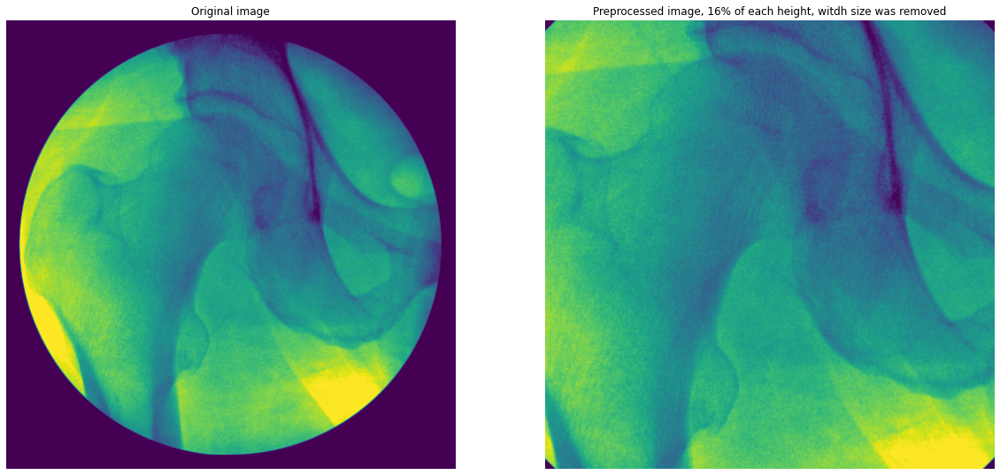

In [6]:
# 전처리 비교
img_ori = dcm2torch('dataset/01433187J/dicom/EXPORT__35.dcm', 0, rotate90=False, fliplr=False)
img = dcm2torch('dataset/01433187J/dicom/EXPORT__35.dcm', 0.16, rotate90=False, fliplr=False)

plt.figure(figsize=(20,12))
plt.subplot(121)
plt.imshow(img_ori[0,0])
plt.title('Original image')
plt.axis('off')
plt.subplot(122)
plt.imshow(img[0,0])
plt.title('Preprocessed image, 16% of each height, witdh size was removed')
plt.axis('off')

# [해결됨] 연구 초반에는 테두리 밖을 관심영역으로 보는 경향이 있어 Crop을 진행했으나, 현재는 ROI 안에만 보도록 수정
## Crop 시 위아래 양쪽 끝으로 16%에 해당하는 부분을 잘라냈습니다만, 너무 많은 이미지가 잘리는 것이 아닌지요?
## Crop을 하는 이유는 이미지 특징을 뽑을때 방해가 되기 때문입니다.

feature counts: 1147 0.42064133286476135 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 1147 0.42064133286476135 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])


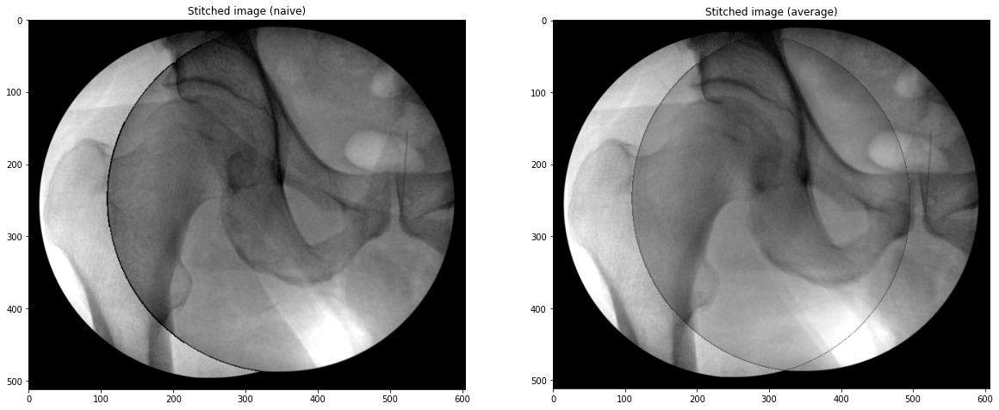

In [7]:
crop_ratio = 0.0
rotate90 = False
# blending_method= 'average'
# blending_method= 'naive'

files = ['dataset/01433187J/dicom/EXPORT__35.dcm',
         'dataset/01433187J/dicom/EXPORT__36.dcm',
         'dataset/01433187J/dicom/EXPORT__37.dcm',
         'dataset/01433187J/dicom/EXPORT__38.dcm',
         'dataset/01433187J/dicom/EXPORT__39.dcm',
         'dataset/01433187J/dicom/EXPORT__40.dcm',
         'dataset/01433187J/dicom/EXPORT__41.dcm',
         'dataset/01433187J/dicom/EXPORT__42.dcm',
         'dataset/01433187J/dicom/EXPORT__43.dcm']
out_naive = stitch_files([files[0],files[1]], crop_ratio, rotate90, 'naive')
out_average = stitch_files([files[0],files[1]], crop_ratio, rotate90, 'average')

plt.figure(figsize=(20,20))
plt.subplot(121)
plt.title('Stitched image (naive)')
plt.imshow(out_naive,cmap='gray')
plt.subplot(122)
plt.title('Stitched image (average)')
plt.imshow(out_average,cmap='gray')
plt.show()

feature counts: 628 0.36205923855304717 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 628 0.36205923855304717 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])


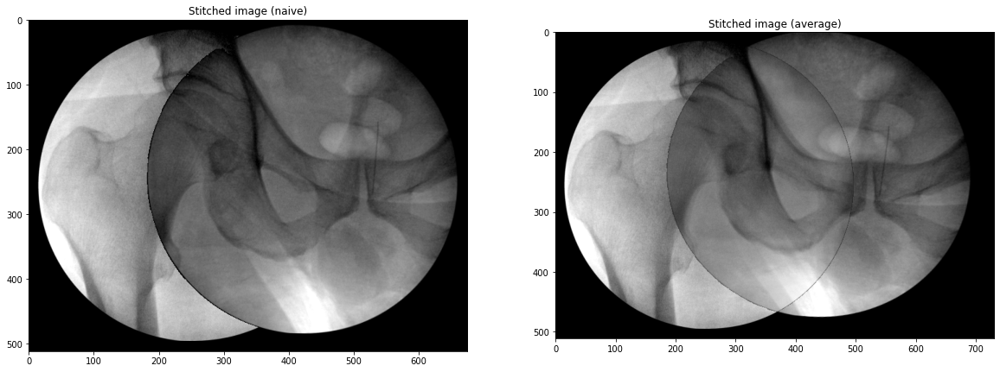

In [8]:
crop_ratio = 0.0
rotate90 = False
# blending_method= 'average'
# blending_method= 'naive'

out_naive = stitch_files([files[0],files[2]], crop_ratio, rotate90, 'naive')
out_average = stitch_files([files[0],files[2]], crop_ratio, rotate90, 'average')

plt.figure(figsize=(20,20))
plt.subplot(121)
plt.title('Stitched image (naive)')
plt.imshow(out_naive,cmap='gray')
plt.subplot(122)
plt.title('Stitched image (average)')
plt.imshow(out_average,cmap='gray')
plt.show()

feature counts: 440 0.35617968440055847 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 440 0.35617968440055847 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])


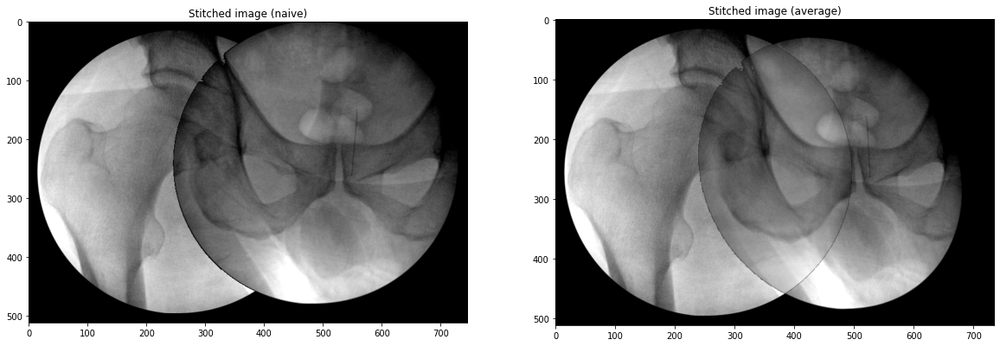

In [9]:
crop_ratio = 0.0
rotate90 = False
# blending_method= 'average'
# blending_method= 'naive'

out_naive = stitch_files([files[0],files[3]], crop_ratio, rotate90, 'naive')
out_average = stitch_files([files[0],files[3]], crop_ratio, rotate90, 'average')

plt.figure(figsize=(20,20))
plt.subplot(121)
plt.title('Stitched image (naive)')
plt.imshow(out_naive,cmap='gray')
plt.subplot(122)
plt.title('Stitched image (average)')
plt.imshow(out_average,cmap='gray')
plt.show()

In [10]:
# check_features_2Dicom('spine_carm_merge/1_16.tif','spine_carm_merge/1_17.tif',True)
# check_features_2Dicom('spine_carm_merge/1_17.tif','spine_carm_merge/1_19.tif',True)
# check_features_2Dicom('spine_carm_merge/1_19.tif','spine_carm_merge/1_21.tif',True)

# C-ARM examples

rotate90:False


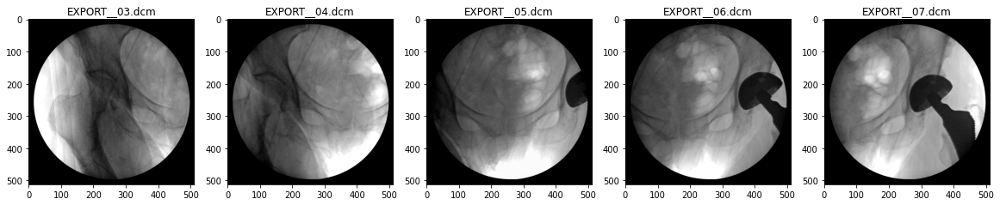

feature counts: 868 0.3721443504095078 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])


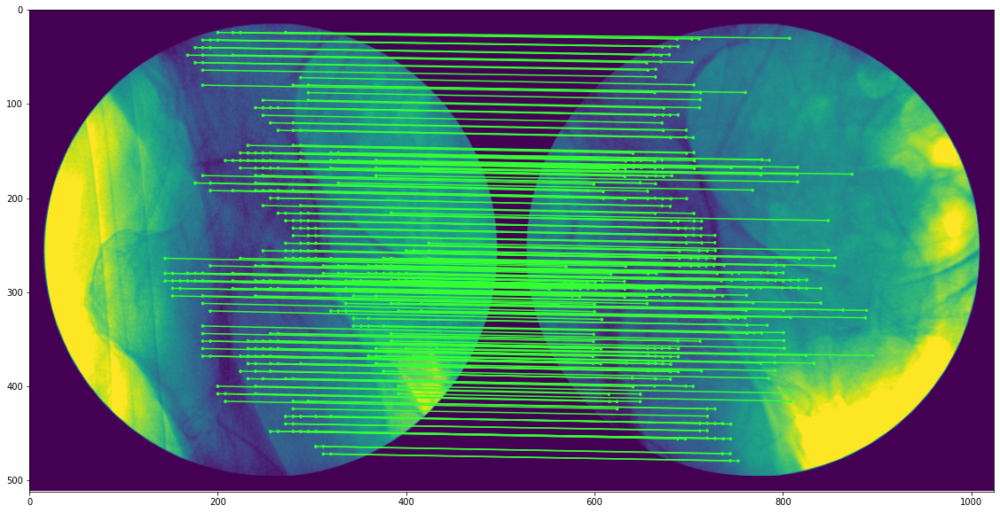

feature counts: 688 0.365577831864357 torch.Size([1, 1, 512, 640]) torch.Size([1, 1, 512, 512])


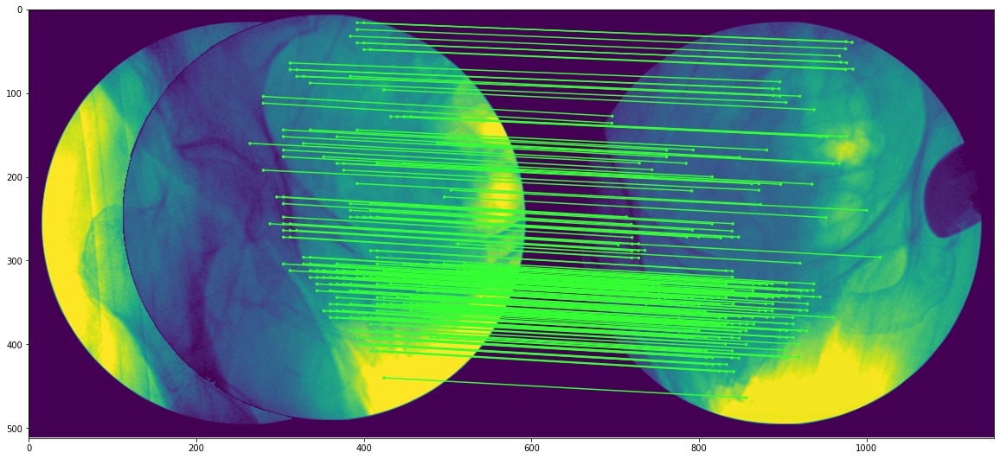

feature counts: 692 0.37151663899421694 torch.Size([1, 1, 512, 832]) torch.Size([1, 1, 512, 512])


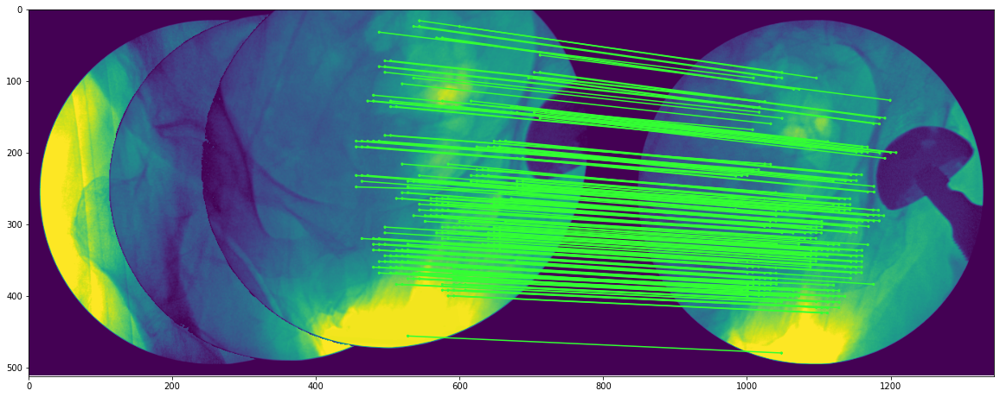

feature counts: 682 0.4112163931131363 torch.Size([1, 1, 512, 960]) torch.Size([1, 1, 512, 512])


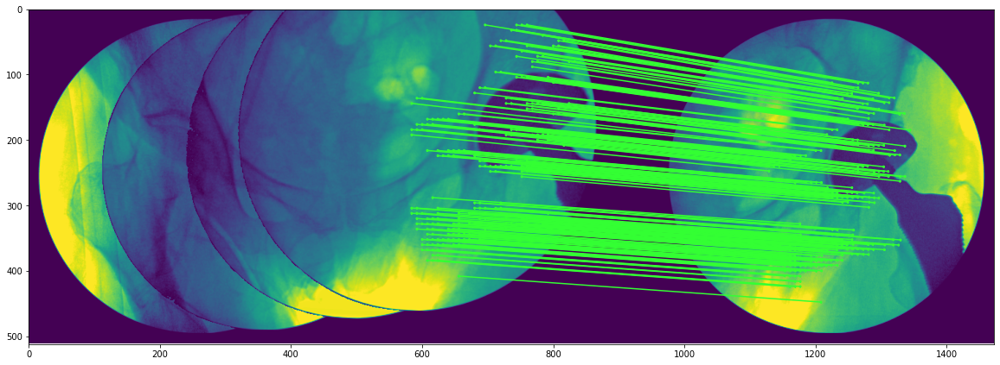

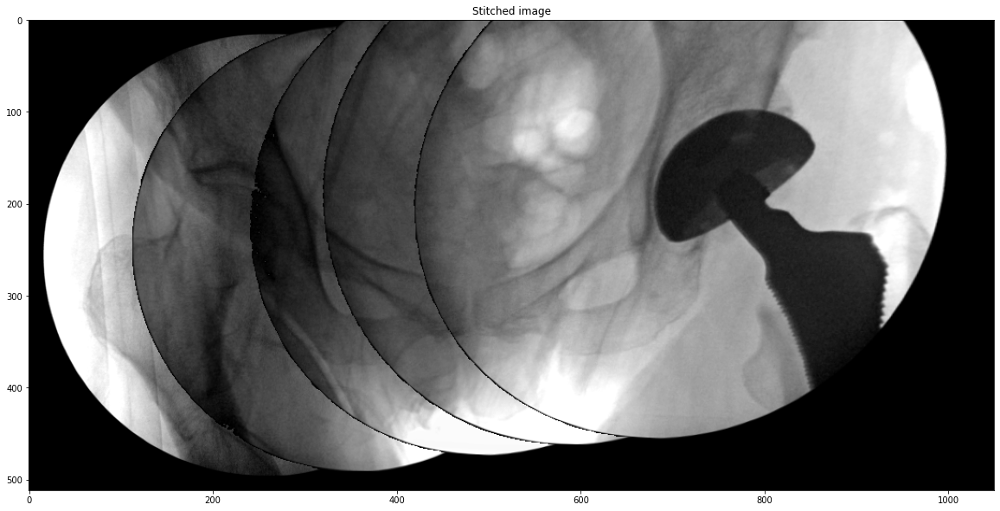

feature counts: 868 0.3721443504095078 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 620 0.3664356291294098 torch.Size([1, 1, 512, 640]) torch.Size([1, 1, 512, 512])
feature counts: 518 0.3384394943714142 torch.Size([1, 1, 512, 768]) torch.Size([1, 1, 512, 512])
feature counts: 505 0.3252063840627671 torch.Size([1, 1, 512, 832]) torch.Size([1, 1, 512, 512])
feature counts: 868 0.3721443504095078 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 1141 0.42490337789058685 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 1018 0.4136780142784119 torch.Size([1, 1, 512, 640]) torch.Size([1, 1, 512, 512])
feature counts: 643 0.3287565171718597 torch.Size([1, 1, 512, 587]) torch.Size([1, 1, 512, 672])
feature counts: 868 0.3721443504095078 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 1141 0.42490337789058685 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 871 0.382

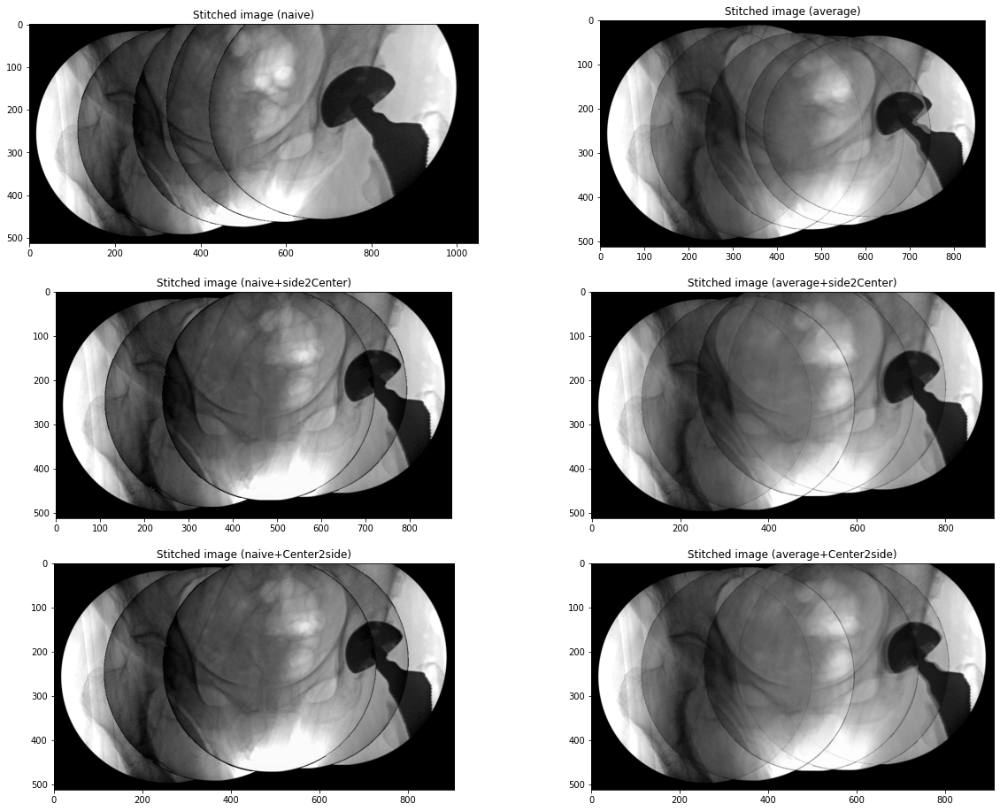

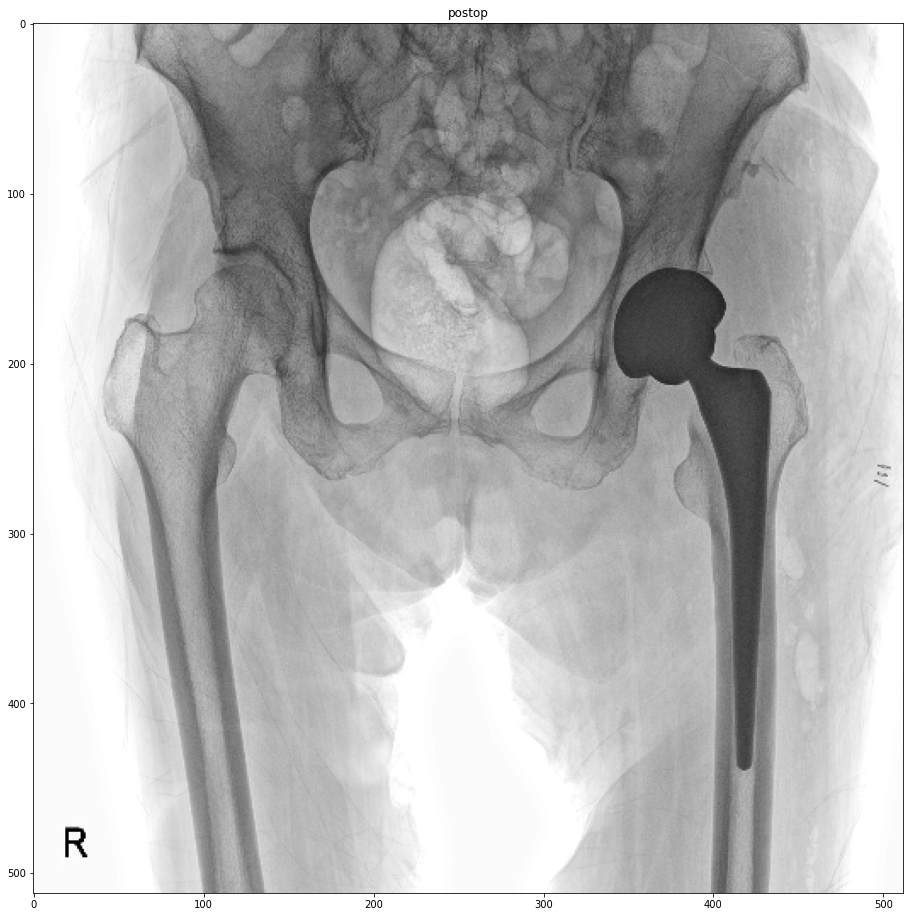

In [22]:
crop_ratio = 0.0
rotate90 = False
# blending_method= 'average'
# blending_method= 'naive'
print(f'rotate90:{rotate90}')

files = []
files.append('dataset/00954570C/EXPORT__03.dcm')
files.append('dataset/00954570C/EXPORT__04.dcm')
files.append('dataset/00954570C/EXPORT__05.dcm')
files.append('dataset/00954570C/EXPORT__06.dcm')
files.append('dataset/00954570C/EXPORT__07.dcm')
# files.append('dataset/00954570C/EXPORT__08.dcm')

out_naive_left2right = stitch_files(files, crop_ratio, rotate90, 'naive', 'left2right',True)
out_average_left2right = stitch_files(files, crop_ratio, rotate90, 'average', 'left2right')
out_naive_side2center = stitch_files(files, crop_ratio, rotate90, 'naive', 'side2center')
out_average_side2center = stitch_files(files, crop_ratio, rotate90, 'average', 'side2center')
out_naive_center2side = stitch_files(files, crop_ratio, rotate90, 'naive', 'center2side')
out_average_center2side = stitch_files(files, crop_ratio, rotate90, 'average', 'center2side')

plt.figure(figsize=(20,16))
plt.subplot(321)
plt.title('Stitched image (naive)')
plt.imshow(out_naive_left2right,cmap='gray')
plt.subplot(322)
plt.title('Stitched image (average)')
plt.imshow(out_average_left2right,cmap='gray')
plt.subplot(323)
plt.title('Stitched image (naive+side2Center)')
plt.imshow(out_naive_side2center,cmap='gray')
plt.subplot(324)
plt.title('Stitched image (average+side2Center)')
plt.imshow(out_average_side2center,cmap='gray')
plt.subplot(325)
plt.title('Stitched image (naive+Center2side)')

plt.imshow(out_naive_center2side,cmap='gray')
plt.subplot(326)
plt.title('Stitched image (average+Center2side)')
plt.imshow(out_average_center2side,cmap='gray')
plt.show()

img = dcm2torch('dataset/00954570C/EXPORT__1 postop.dcm')
plt.figure(figsize=(16,16))
plt.title('postop')
plt.imshow(1-img[0,0],cmap='gray')

rotate90:False
feature counts: 987 0.37150949239730835 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 502 0.32988765835762024 torch.Size([1, 1, 512, 640]) torch.Size([1, 1, 512, 512])
feature counts: 893 0.3617278873920441 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 967 0.4322917968034744 torch.Size([1, 1, 512, 640]) torch.Size([1, 1, 512, 512])
feature counts: 609 0.3707127720117569 torch.Size([1, 1, 512, 658]) torch.Size([1, 1, 512, 739])


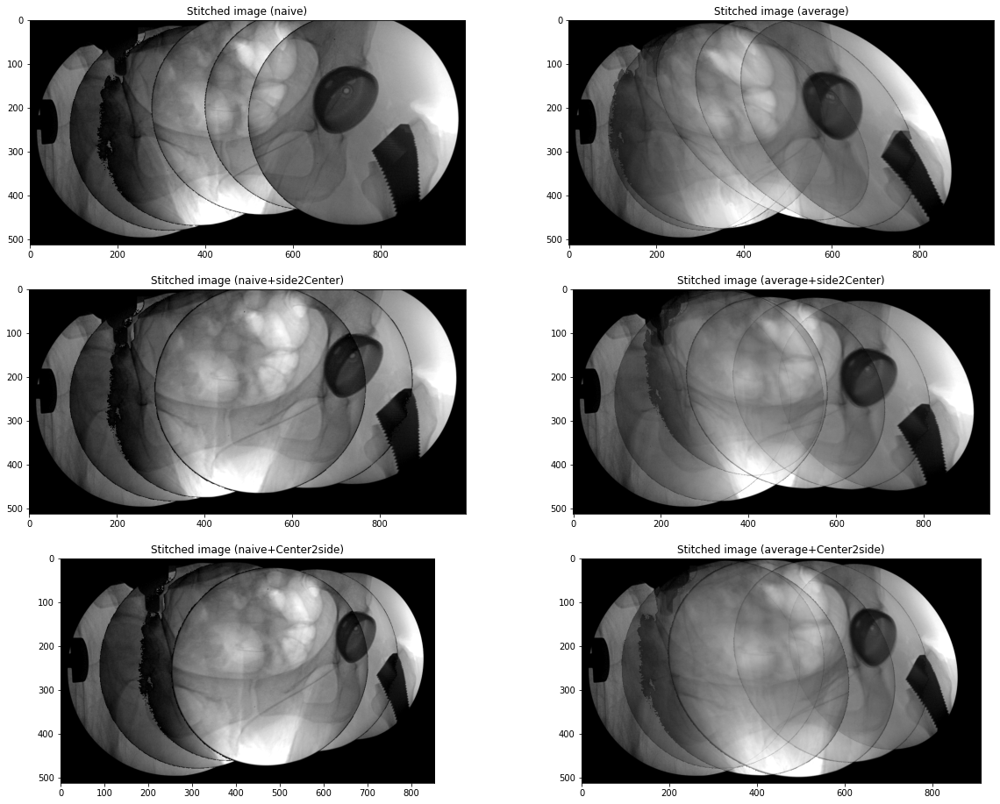

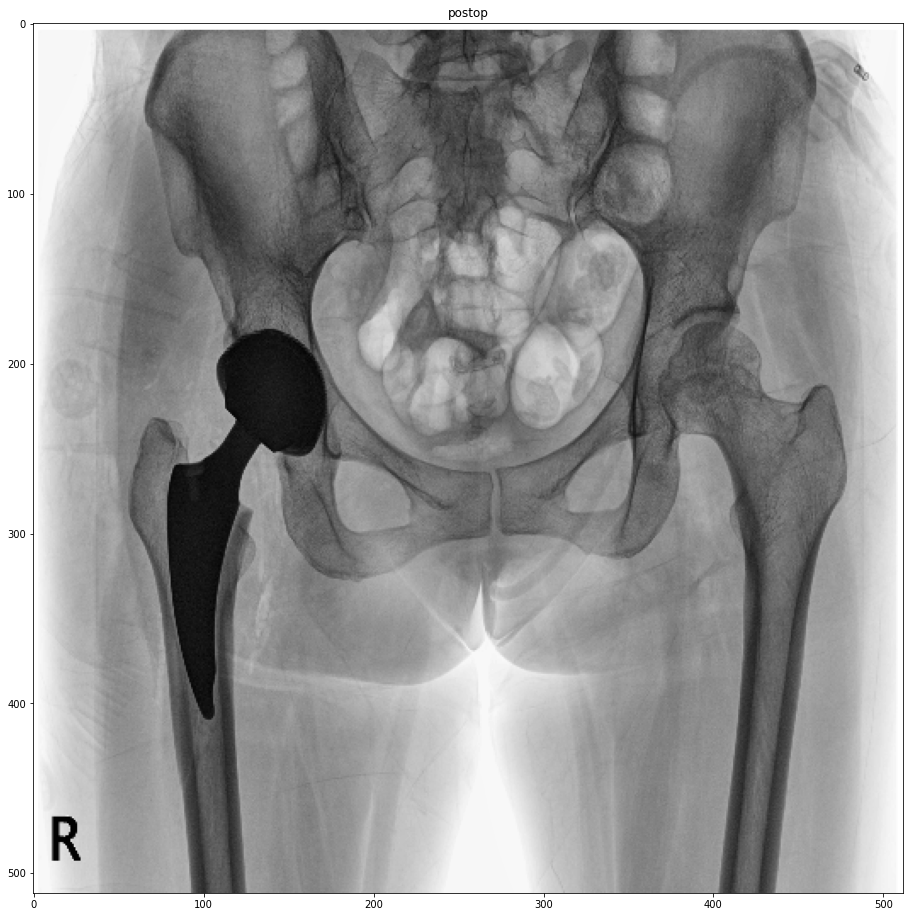

In [20]:
crop_ratio = 0
rotate90 = False
# blending_method= 'average'
# blending_method= 'naive'
print(f'rotate90:{rotate90}')

files = []
files.append('dataset/01601914L/EXPORT__06.dcm')
files.append('dataset/01601914L/EXPORT__07.dcm')
files.append('dataset/01601914L/EXPORT__08.dcm')
files.append('dataset/01601914L/EXPORT__09.dcm')
files.append('dataset/01601914L/EXPORT__10.dcm')
files.append('dataset/01601914L/EXPORT__11.dcm')

# out_naive_left2right = stitch_files(files, crop_ratio, rotate90, 'naive', 'left2right')
# out_average_left2right = stitch_files(files, crop_ratio, rotate90, 'average', 'left2right')
# out_naive_side2center = stitch_files(files, crop_ratio, rotate90, 'naive', 'side2center')
# out_average_side2center = stitch_files(files, crop_ratio, rotate90, 'average', 'side2center')
# out_naive_center2side = stitch_files(files, crop_ratio, rotate90, 'naive', 'center2side')
out_average_center2side = stitch_files(files, crop_ratio, rotate90, 'average', 'center2side')

plt.figure(figsize=(20,16))
plt.subplot(321)
plt.title('Stitched image (naive)')
plt.imshow(out_naive_left2right,cmap='gray')
plt.subplot(322)
plt.title('Stitched image (average)')
plt.imshow(out_average_left2right,cmap='gray')
plt.subplot(323)
plt.title('Stitched image (naive+side2Center)')
plt.imshow(out_naive_side2center,cmap='gray')
plt.subplot(324)
plt.title('Stitched image (average+side2Center)')
plt.imshow(out_average_side2center,cmap='gray')
plt.subplot(325)
plt.title('Stitched image (naive+Center2side)')
plt.imshow(out_naive_center2side,cmap='gray')
plt.subplot(326)
plt.title('Stitched image (average+Center2side)')
plt.imshow(out_average_center2side,cmap='gray')
plt.show()

img = dcm2torch('dataset/01601914L/EXPORT_postop_1.dcm')
plt.figure(figsize=(16,16))
plt.title('postop')
plt.imshow(1-img[0,0],cmap='gray')

rotate90:False
feature counts: 1147 0.42064133286476135 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 1225 0.4766120195388794 torch.Size([1, 1, 512, 640]) torch.Size([1, 1, 512, 512])
feature counts: 1101 0.49531090259552 torch.Size([1, 1, 512, 704]) torch.Size([1, 1, 512, 512])
feature counts: 1199 0.6089229464530945 torch.Size([1, 1, 512, 768]) torch.Size([1, 1, 512, 512])
feature counts: 1153 0.4850752353668213 torch.Size([1, 1, 512, 768]) torch.Size([1, 1, 512, 512])
feature counts: 972 0.4221474230289459 torch.Size([1, 1, 512, 832]) torch.Size([1, 1, 512, 512])
feature counts: 1012 0.48988258838653564 torch.Size([1, 1, 512, 896]) torch.Size([1, 1, 512, 512])
feature counts: 975 0.40690677165985106 torch.Size([1, 1, 512, 896]) torch.Size([1, 1, 512, 512])
feature counts: 757 0.3932090878486633 torch.Size([1, 1, 512, 1024]) torch.Size([1, 1, 512, 512])
feature counts: 1147 0.42064133286476135 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
featu

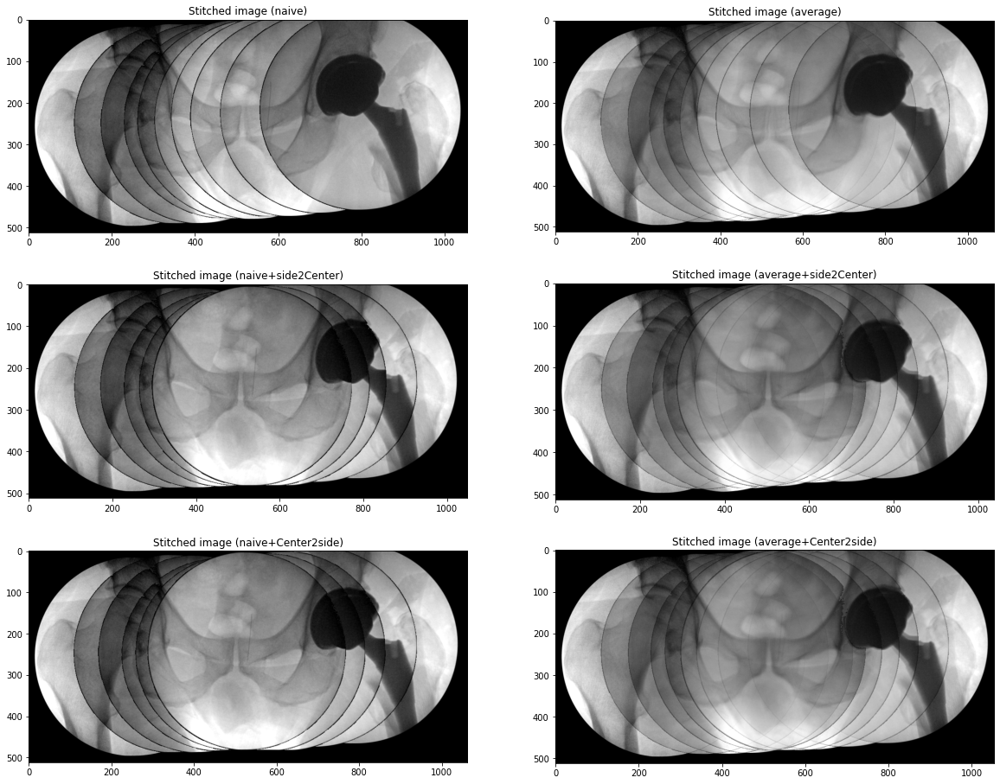

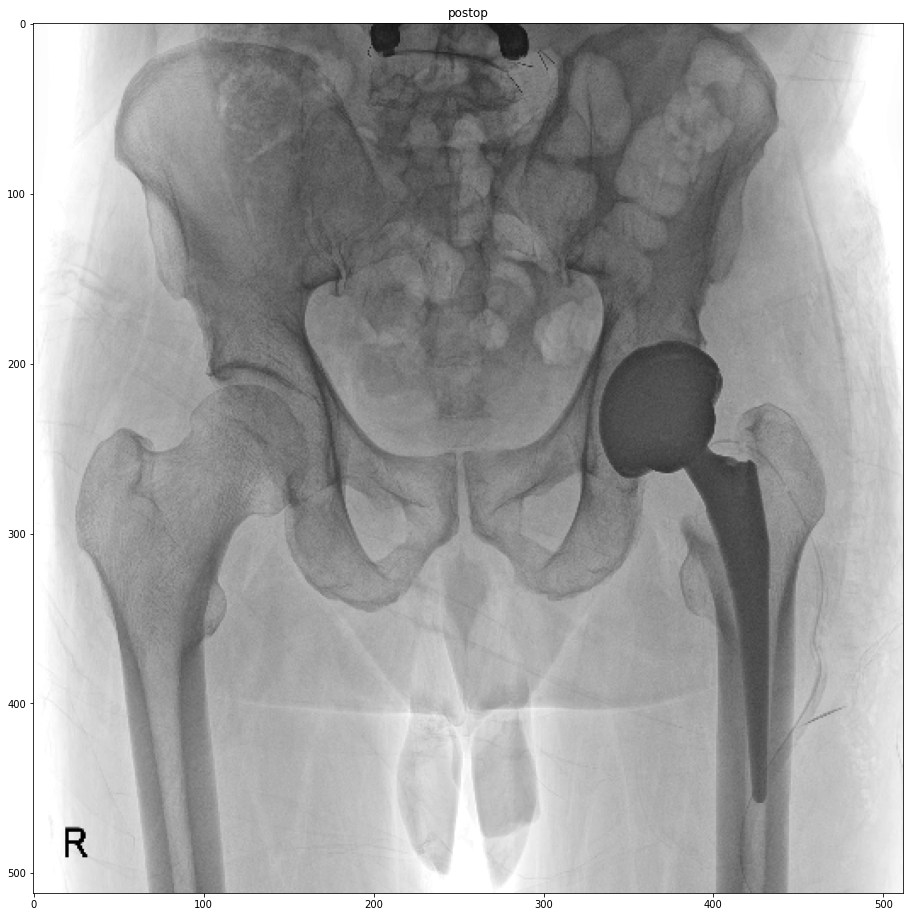

In [14]:
crop_ratio = 0
rotate90 = False
# blending_method= 'average'
# blending_method= 'naive'
print(f'rotate90:{rotate90}')

files = []
files.append('dataset/01433187J/dicom/EXPORT__35.dcm')
files.append('dataset/01433187J/dicom/EXPORT__36.dcm')
files.append('dataset/01433187J/dicom/EXPORT__37.dcm')
files.append('dataset/01433187J/dicom/EXPORT__38.dcm')
files.append('dataset/01433187J/dicom/EXPORT__39.dcm')
files.append('dataset/01433187J/dicom/EXPORT__40.dcm')
files.append('dataset/01433187J/dicom/EXPORT__41.dcm')
files.append('dataset/01433187J/dicom/EXPORT__42.dcm')
files.append('dataset/01433187J/dicom/EXPORT__43.dcm')
files.append('dataset/01433187J/dicom/EXPORT__44.dcm')

out_naive_left2right = stitch_files(files, crop_ratio, rotate90, 'naive', 'left2right')
out_average_left2right = stitch_files(files, crop_ratio, rotate90, 'average', 'left2right')
out_naive_side2center = stitch_files(files, crop_ratio, rotate90, 'naive', 'side2center')
out_average_side2center = stitch_files(files, crop_ratio, rotate90, 'average', 'side2center')
out_naive_center2side = stitch_files(files, crop_ratio, rotate90, 'naive', 'center2side')
out_average_center2side = stitch_files(files, crop_ratio, rotate90, 'average', 'center2side')

plt.figure(figsize=(20,16))
plt.subplot(321)
plt.title('Stitched image (naive)')
plt.imshow(out_naive_left2right,cmap='gray')
plt.subplot(322)
plt.title('Stitched image (average)')
plt.imshow(out_average_left2right,cmap='gray')
plt.subplot(323)
plt.title('Stitched image (naive+side2Center)')
plt.imshow(out_naive_side2center,cmap='gray')
plt.subplot(324)
plt.title('Stitched image (average+side2Center)')
plt.imshow(out_average_side2center,cmap='gray')
plt.subplot(325)
plt.title('Stitched image (naive+Center2side)')
plt.imshow(out_naive_center2side,cmap='gray')
plt.subplot(326)
plt.title('Stitched image (average+Center2side)')
plt.imshow(out_average_center2side,cmap='gray')
plt.show()

img = dcm2torch('dataset/01433187J/postop2.dcm')
plt.figure(figsize=(16,16))
plt.title('postop')
plt.imshow(1-img[0,0],cmap='gray')

rotate90:False
feature counts: 1557 0.5531753957271576 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 1141 0.4443225681781769 torch.Size([1, 1, 512, 576]) torch.Size([1, 1, 512, 512])
feature counts: 932 0.4111993044614792 torch.Size([1, 1, 512, 704]) torch.Size([1, 1, 512, 512])
feature counts: 714 0.40458959341049194 torch.Size([1, 1, 512, 768]) torch.Size([1, 1, 512, 512])
feature counts: 1557 0.5531753957271576 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 1031 0.4112939089536667 torch.Size([1, 1, 512, 576]) torch.Size([1, 1, 512, 512])
feature counts: 825 0.3863465189933777 torch.Size([1, 1, 512, 704]) torch.Size([1, 1, 512, 512])
feature counts: 624 0.4067941904067993 torch.Size([1, 1, 512, 768]) torch.Size([1, 1, 512, 512])
feature counts: 1557 0.5531753957271576 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 813 0.344086354970932 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature co

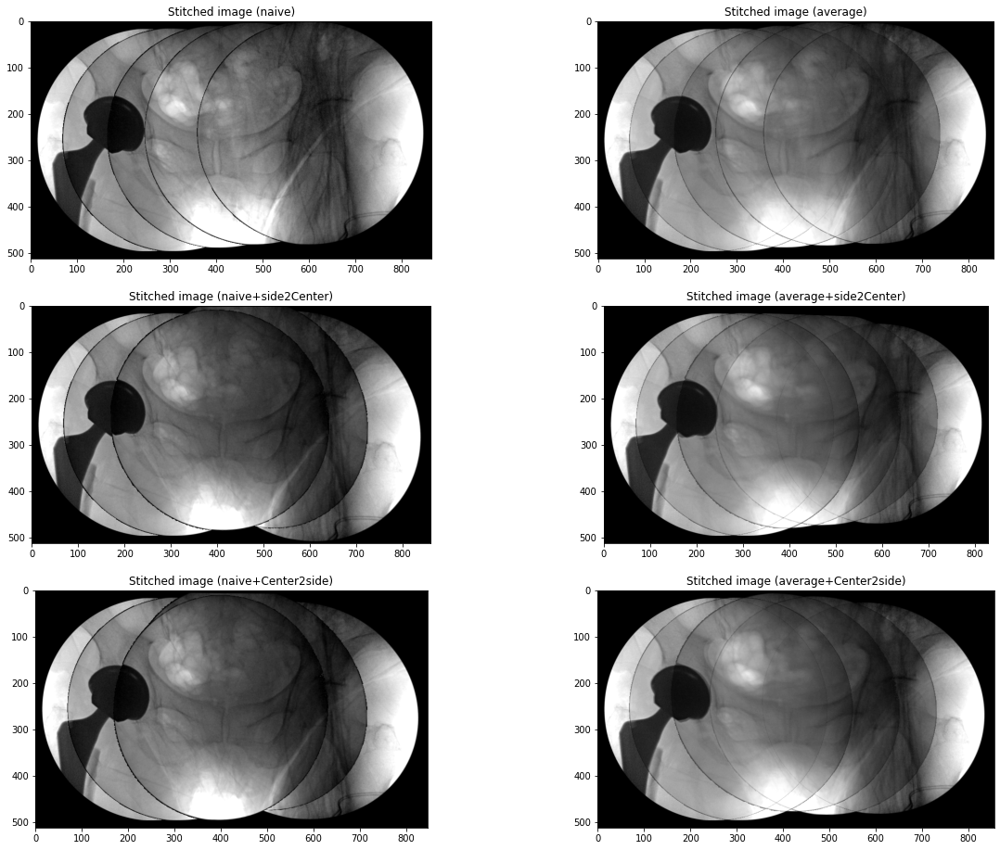

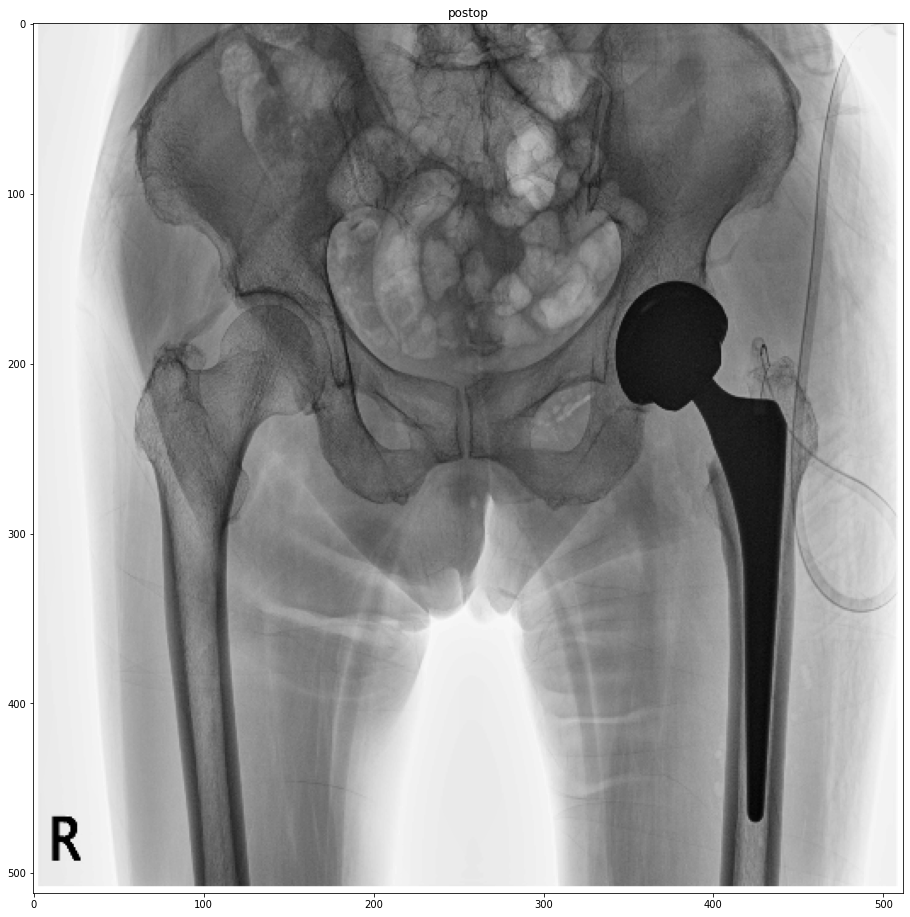

In [15]:
crop_ratio = 0
rotate90 = False
# blending_method= 'average'
# blending_method= 'naive'
print(f'rotate90:{rotate90}')

files = []
files.append('dataset/01476653L/dicom/EXPORT__25.dcm')
# files.append('dataset/01476653L/dicom/EXPORT__26.dcm')
files.append('dataset/01476653L/dicom/EXPORT__27.dcm')
# files.append('dataset/01476653L/dicom/EXPORT__28.dcm')
files.append('dataset/01476653L/dicom/EXPORT__29.dcm')
# files.append('dataset/01476653L/dicom/EXPORT__30.dcm')
files.append('dataset/01476653L/dicom/EXPORT__31.dcm')
# files.append('dataset/01476653L/dicom/EXPORT__32.dcm')
files.append('dataset/01476653L/dicom/EXPORT__33.dcm')
# files.append('dataset/01476653L/dicom/EXPORT__34.dcm')

out_naive_left2right = stitch_files(files, crop_ratio, rotate90, 'naive', 'left2right')
out_average_left2right = stitch_files(files, crop_ratio, rotate90, 'average', 'left2right')
out_naive_side2center = stitch_files(files, crop_ratio, rotate90, 'naive', 'side2center')
out_average_side2center = stitch_files(files, crop_ratio, rotate90, 'average', 'side2center')
out_naive_center2side = stitch_files(files, crop_ratio, rotate90, 'naive', 'center2side')
out_average_center2side = stitch_files(files, crop_ratio, rotate90, 'average', 'center2side')

plt.figure(figsize=(20,16))
plt.subplot(321)
plt.title('Stitched image (naive)')
plt.imshow(out_naive_left2right,cmap='gray')
plt.subplot(322)
plt.title('Stitched image (average)')
plt.imshow(out_average_left2right,cmap='gray')
plt.subplot(323)
plt.title('Stitched image (naive+side2Center)')
plt.imshow(out_naive_side2center,cmap='gray')
plt.subplot(324)
plt.title('Stitched image (average+side2Center)')
plt.imshow(out_average_side2center,cmap='gray')
plt.subplot(325)
plt.title('Stitched image (naive+Center2side)')
plt.imshow(out_naive_center2side,cmap='gray')
plt.subplot(326)
plt.title('Stitched image (average+Center2side)')
plt.imshow(out_average_center2side,cmap='gray')
plt.show()

img = dcm2torch('dataset/01476653L/postop2.dcm')
plt.figure(figsize=(16,16))
plt.title('postop')
plt.imshow(1-img[0,0],cmap='gray')

In [16]:
# crop_ratio = 0
# rotate90 = False
# # blending_method= 'average'
# # blending_method= 'naive'
# print(f'rotate90:{rotate90}')

# files = []
# files.append('dataset/01060888K/EXPORT__06.dcm')
# files.append('dataset/01060888K/EXPORT__07.dcm')
# files.append('dataset/01060888K/EXPORT__08.dcm')

# out_naive_left2right = stitch_files(files, crop_ratio, rotate90, 'naive', 'left2right')
# out_average_left2right = stitch_files(files, crop_ratio, rotate90, 'average', 'left2right')
# out_naive_side2center = stitch_files(files, crop_ratio, rotate90, 'naive', 'side2center')
# out_average_side2center = stitch_files(files, crop_ratio, rotate90, 'average', 'side2center')
# out_naive_center2side = stitch_files(files, crop_ratio, rotate90, 'naive', 'center2side')
# out_average_center2side = stitch_files(files, crop_ratio, rotate90, 'average', 'center2side')

# plt.figure(figsize=(20,16))
# plt.subplot(321)
# plt.title('Stitched image (naive)')
# plt.imshow(out_naive_left2right,cmap='gray')
# plt.subplot(322)
# plt.title('Stitched image (average)')
# plt.imshow(out_average_left2right,cmap='gray')
# plt.subplot(323)
# plt.title('Stitched image (naive+side2Center)')
# plt.imshow(out_naive_side2center,cmap='gray')
# plt.subplot(324)
# plt.title('Stitched image (average+side2Center)')
# plt.imshow(out_average_side2center,cmap='gray')
# plt.subplot(325)
# plt.title('Stitched image (naive+Center2side)')
# plt.imshow(out_naive_center2side,cmap='gray')
# plt.subplot(326)
# plt.title('Stitched image (average+Center2side)')
# plt.imshow(out_average_center2side,cmap='gray')
# plt.show()

rotate90:True
feature counts: 611 0.33916679918766024 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 727 0.36621286869049074 torch.Size([1, 1, 512, 768]) torch.Size([1, 1, 512, 512])
feature counts: 540 0.32140544056892395 torch.Size([1, 1, 512, 832]) torch.Size([1, 1, 512, 512])
feature counts: 611 0.33916679918766024 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 408 0.3700550854206085 torch.Size([1, 1, 512, 768]) torch.Size([1, 1, 512, 512])
feature counts: 309 0.3254572331905365 torch.Size([1, 1, 512, 896]) torch.Size([1, 1, 512, 512])
feature counts: 611 0.33916679918766024 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 871 0.3770120292901993 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature counts: 618 0.3392147719860077 torch.Size([1, 1, 512, 803]) torch.Size([1, 1, 512, 641])
feature counts: 611 0.33916679918766024 torch.Size([1, 1, 512, 512]) torch.Size([1, 1, 512, 512])
feature co

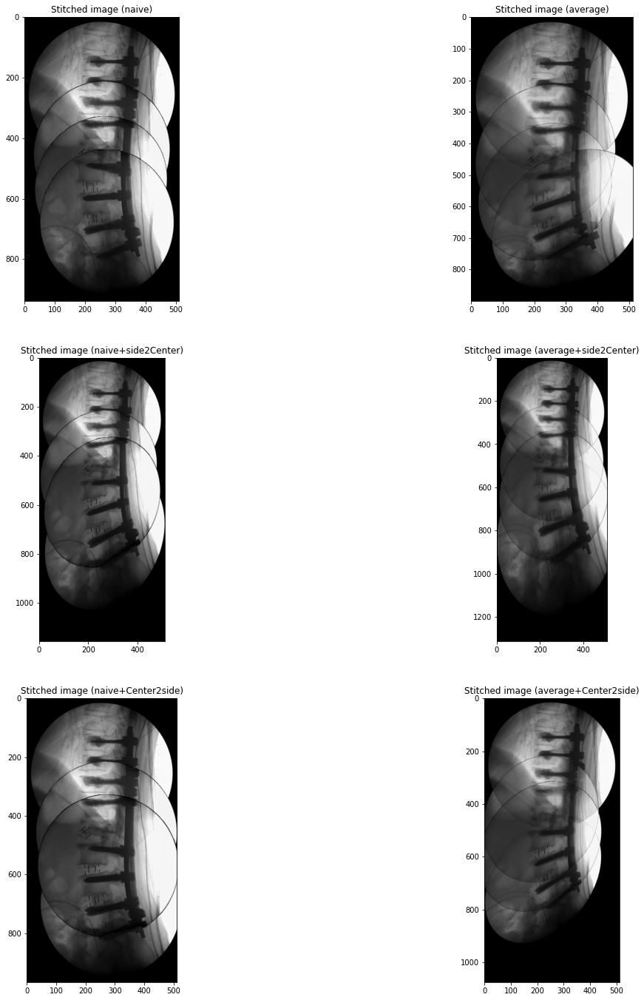

In [21]:
crop_ratio = 0
rotate90 = True
# blending_method= 'average'
blending_method= 'naive'
print(f'rotate90:{rotate90}')

files = []
files.append('spine_carm_merge/1_21.tif')
files.append('spine_carm_merge/1_19.tif')
files.append('spine_carm_merge/1_17.tif')
files.append('spine_carm_merge/1_16.tif')

out_naive_left2right = stitch_files(files, crop_ratio, rotate90, 'naive', 'left2right')
out_average_left2right = stitch_files(files, crop_ratio, rotate90, 'average', 'left2right')
out_naive_side2center = stitch_files(files, crop_ratio, rotate90, 'naive', 'side2center')
out_average_side2center = stitch_files(files, crop_ratio, rotate90, 'average', 'side2center')
out_naive_center2side = stitch_files(files, crop_ratio, rotate90, 'naive', 'center2side')
out_average_center2side = stitch_files(files, crop_ratio, rotate90, 'average', 'center2side')

plt.figure(figsize=(20,24))
plt.subplot(321)
plt.title('Stitched image (naive)')
plt.imshow(out_naive_left2right,cmap='gray')
plt.subplot(322)
plt.title('Stitched image (average)')
plt.imshow(out_average_left2right,cmap='gray')
plt.subplot(323)
plt.title('Stitched image (naive+side2Center)')
plt.imshow(out_naive_side2center,cmap='gray')
plt.subplot(324)
plt.title('Stitched image (average+side2Center)')
plt.imshow(out_average_side2center,cmap='gray')
plt.subplot(325)
plt.title('Stitched image (naive+Center2side)')
plt.imshow(out_naive_center2side,cmap='gray')
plt.subplot(326)
plt.title('Stitched image (average+Center2side)')
plt.imshow(out_average_center2side,cmap='gray')
plt.show()

# Conclusion